# Animation 일부

## 1

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numba import jit
from tqdm.notebook import tqdm

import matplotlib.colors as colors

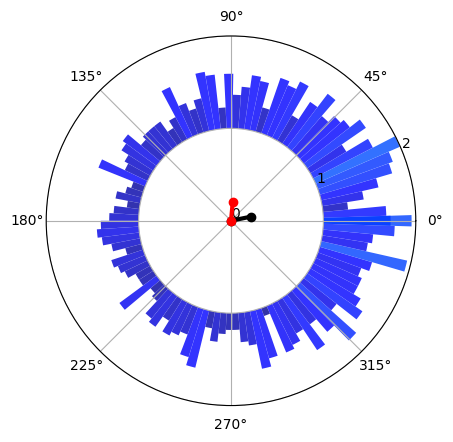

In [ ]:
index= 10
num_bin = 100
bins = np.linspace(0,2*np.pi,num_bin+1)
bin_ = np.linspace(0,2*np.pi,num_bin)



cs1,_ = np.histogram(sol[index,:]%(np.pi*2),bins=bins,density=True)
cs1 = cs1 / np.max(cs1)


bottom = 1
max_height = 1
radii1 = max_height*cs1
width = (2*np.pi) / num_bin
fig =plt.figure()
ax = plt.subplot(111, polar=True)
bars1 = ax.bar(bin_, radii1, width=width, bottom=bottom)
# bars2 = ax.bar(bin_, radii2, width=width, bottom=bottom)

for r, bar in zip(radii1, bars1):
    bar.set_facecolor(plt.cm.jet(r/5))
    bar.set_height(r)
    bar.set_alpha(0.8)
pl1, = plt.plot([0,np.angle(rabs[index])],[0,abs(rabs[index])],color='black',lw=3,marker='o')
pl2, = plt.plot([0,np.angle(sigma_phi)],[0,abs(sigma_phi)],color='red',lw=3,marker='o')
# for r, bar in zip(radii2, bars2):
#     bar.set_facecolor(plt.cm.jet_r(r/5))
#     bar.set_alpha(0.8)
plt.ylim(0,2)
plt.yticks([0,1,2]);
# plt.show()

In [ ]:
def FOR_DATA(sol):
    cs1s = [] 
    for T in sol:
        cs1,_ = np.histogram(T%(np.pi*2),bins=bins,density=True)
        cs1s.append(cs1)
    cs1s = np.array(cs1s)
    cs1s = cs1s / np.max(cs1s)
    Xs,Ys = [],[]
    for r in rabs:
        x,y = [0,np.angle(r)],[0,abs(r)]
        Xs.append(x)
        Ys.append(y)
    Xs = np.array(Xs)
    Ys = np.array(Ys)
    return cs1s,Xs,Ys
A,Xs,Ys = FOR_DATA(sol)

In [ ]:
def get_ani(idx):
    radii1 = A[idx]
    for r, bar in zip(radii1, bars1):
        bar.set_facecolor(plt.cm.jet(r/5))
        bar.set_height(r)
        bar.set_alpha(0.8)
    pl1.set_xdata(Xs[idx])
    pl1.set_ydata(Ys[idx])
len(t)
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
%config InlineBackend.figure_format = 'retina'
idxs=  np.arange(0,500,1)
ani = FuncAnimation(fig,get_ani,frames=idxs,interval=50)
HTML(ani.to_jshtml())
# ani.save(rf'HIGH ORDER CHIMERA/SB_B pi N={N1},alpha={alpha:.01f},beta={beta:.01f}.mp4',dpi=300)

In [ ]:
def get_ani(idx):
    radii1 = A[idx]
    for r, bar in zip(radii1, bars1):
        bar.set_facecolor(plt.cm.jet(r/5))
        bar.set_height(r)
        bar.set_alpha(0.8)
    pl1.set_xdata(Xs[idx])
    pl1.set_ydata(Ys[idx])
    
len(t)
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
%config InlineBackend.figure_format = 'retina'
idxs=  np.arange(0,2500,10)
ani = FuncAnimation(fig,get_ani,frames=idxs,interval=50)
HTML(ani.to_jshtml())
# ani.save(rf'HIGH ORDER CHIMERA/SB_B pi N={N1},alpha={alpha:.01f},beta={beta:.01f}.mp4',dpi=300)

## 2

C:\Users\kim9y\AppData\Local\Temp\ipykernel_27516\680756332.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


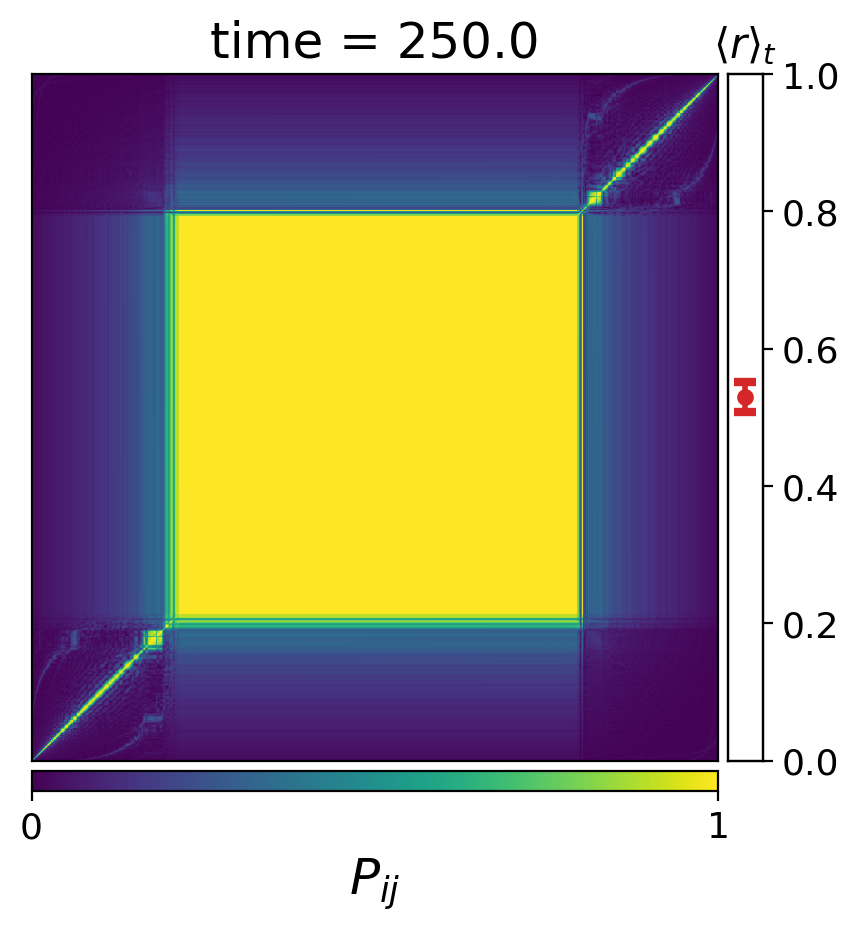

In [ ]:
fig, ax = plt.subplots(1,1,dpi=100,facecolor='white')
im = ax.imshow(Pij[time_],origin='lower')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title(f'time = {time[time_]:.1f}',fontsize=18)
divider2 = make_axes_locatable(ax)
cax = divider2.append_axes("bottom", size="3%", pad=0.05)
rstd_bar = divider2.append_axes("right", size="5%", pad=0.05)
rstd_bar.set_yticks([])
rstd_bar.set_xticks([])
rax = rstd_bar.twinx()
err =rax.errorbar(0.5,rmean_set[time_],rstd_set[time_],
            fmt='.',color ='tab:red',zorder=2,capsize=4,elinewidth=2,capthick=3,ms=10,)
# rax.scatter(0.5,rmean_set[time_],color='red',marker='d',zorder=1)
rax.set_ylim(0,1)
rstd_bar.set_title(r'$\langle$$r$$\rangle$$_t$',fontsize=10*multi_)
plt.sca(rax)
plt.yticks(fontsize=13)
    # cax.axis('off')
colorbar = fig.colorbar(im, cax=cax, orientation="horizontal")

colorbar.set_ticks([0,1])
plt.sca(cax)
plt.xticks(fontsize=13)

colorbar.set_label(r'$P_{ij}$',fontsize=18)
fig.tight_layout()
def Animation(i):
    im.set_data(Pij[i])
    rax.clear()
    # rax.set_ylabel(r'$\langle$$r$$\rangle$$_t$')
    rstd_bar.set_xticks([])
    rax.set_ylim(0,1)
    err =rax.errorbar(0.5,rmean_set[i],rstd_set[i],
                        fmt='.',color ='tab:red',zorder=2,capsize=4,elinewidth=2,capthick=3,ms=10,)
    ax.set_title(f'm = {m}, K = {K}, time = {time[i]:.1f}')

In [ ]:
idx = range(0,len(Pij),1)

In [ ]:
%config InlineBackend.figure_format = 'retina'
ani = FuncAnimation(fig,Animation,frames=idx,interval=30)
ani.save(f'23.10.19 animations_Clusters oscillatiors average interaction m={m} Q_distribution.mp4',dpi=400)
HTML(ani.to_html5_video()) 